Learn how to forecast House prices using machine learning. Explore various methods of supervised machine learning, conduct exploratory data analysis, perform feature engineering, and select the best model. Gain valuable insights and draw conclusions from the dataset.

# Forecasting House Prices Using Machine Learning

![](https://i.imgur.com/ft1qiup.jpg)

## Business Problem Statement

Predicting House Prices based on Propery Type, Location & etc.

In this notebook we will explore Supervised Machine Learning methods. Regression models such as linear regression, decision tree and ensemble models such as RandomForest will trained to predict house prices using Scikit Learn. We will use Pandas, Numpy, Matplotlib, Seaborn and Plotly to perform exploratory data analysis and gather insights for machine learning. We will do the following:-


1. Installation and importation of necessary libraries.
2. Exploration of the dataset and merging of different files, if needed.
3. Translation of the business problem into a machine learning problem.
4. Conducting exploratory data analysis
 (EDA).
5. Performing feature engineering.
6. Preparing the data, which includes
 tasks such as train-validation splitting, encoding, imputing, and scaling.
7. Selection of relevant input features.
8. Definition of evaluation metrics.
9. Establishment of a baseline model.
10. Selection of the best model without
 hyperparameter tuning.
11. Hyperparameter tuning for selected models.
12. Generating predictions.
13. Summarizing insights and key learnings.

By following this comprehensive approach, we aim to extract meaningful information and draw valuable conclusions from our dataset.

### Installing and Importing Libraries

In [1]:
!pip install pandas-profiling numpy matplotlib seaborn --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 5.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.5/357.5 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 395.8/395.8 kB 12.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 13.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 13.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 20.9 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
lida 0.0.10 requires fastapi, which is not installed.
lida 0.0.10 requires kaleido, which is not installed.
lida 0.0.10 requires pyt

In [2]:
!pip install opendatasets scikit-learn --quiet --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.8/10.8 MB 21.4 MB/s eta 0:00:00


In [3]:
#import visualisation libraries
import opendatasets as od
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib
import os
%matplotlib inline

# Set plot parameters for the notebook
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

## Exploring the dataset

#### Download and Extract Data

In [4]:
# Dataset link
data_url = 'https://www.kaggle.com/datasets/hm-land-registry/uk-housing-prices-paid?rvi=1'

In [5]:
od.download(data_url)

100%|██████████| 731M/731M [00:06<00:00, 118MB/s]


In [6]:
os.listdir('uk-housing-prices-paid')

['price_paid_records.csv']

In [7]:
# Take 1 Million rows dataset
# Specify the CSV file path
csv_file = 'uk-housing-prices-paid/price_paid_records.csv'

# Determine the total number of rows in the CSV file
with open(csv_file, 'r') as f:
    total_rows = sum(1 for line in f)

# Number of rows you want to skip (to get the last 1,000 rows)
rows_to_skip = total_rows - 1000000

# Read the last 1,000 rows from the CSV file
raw_df = pd.read_csv(csv_file, skiprows=range(1, rows_to_skip))


In [8]:
raw_df

,Transaction unique identifier,Price,Date of Transfer,Property Type,Old/New,Duration,Town/City,District,County,PPDCategory Type,Record Status - monthly file only
0,{31FB4C17-0C49-57B9-E050-A8C063053436},175000,2016-01-06 00:00,T,N,F,BARNSTAPLE,NORTH DEVON,DEVON,A,A
1,{31FB4C17-0C4A-57B9-E050-A8C063053436},144000,2016-03-15 00:00,T,N,L,TIVERTON,MID DEVON,DEVON,A,A
2,{31FB4C17-0C4B-57B9-E050-A8C063053436},76000,2016-03-21 00:00,F,N,L,BEAWORTHY,TORRIDGE,DEVON,A,A
3,{31FB4C17-0C4C-57B9-E050-A8C063053436},365000,2016-03-30 00:00,F,N,L,BRAUNTON,NORTH DEVON,DEVON,A,A
4,{31FB4C17-0C4D-57B9-E050-A8C063053436},125000,2016-04-15 00:00,F,N,L,PLYMOUTH,CITY OF PLYMOUTH,CITY OF PLYMOUTH,A,A
...,...,...,...,...,...,...,...,...,...,...,...
999995,{4C4EE000-291A-1854-E050-A8C063054F34},175000,2017-02-20 00:00,S,N,F,LEEDS,LEEDS,WEST YORKSHIRE,A,A
999996,{4C4EE000-291B-1854-E050-A8C063054F34},586945,2017-02-15 00:00,D,N,F,WETHERBY,LEEDS,WEST YORKSHIRE,A,A
999997,{4C4EE000-291C-1854-E050-A8C063054F34},274000,2017-02-24 00:00,D,N,L,HUDDERSFIELD,KIRKLEES,WEST YORKSHIRE,A,A
999998,{4C4EE000-291D-1854-E050-A8C063054F34},36000,2017-02-22 00:00,T,N,F,HALIFAX,CALDERDALE,WEST YORKSHIRE,A,A


In [9]:
# Drop the unuse columns
raw_df = raw_df.drop(['Transaction unique identifier','Record Status - monthly file only','Town/City','District'],axis=1)

In [10]:
raw_df[:5]

,Price,Date of Transfer,Property Type,Old/New,Duration,County,PPDCategory Type
0,175000,2016-01-06 00:00,T,N,F,DEVON,A
1,144000,2016-03-15 00:00,T,N,L,DEVON,A
2,76000,2016-03-21 00:00,F,N,L,DEVON,A
3,365000,2016-03-30 00:00,F,N,L,DEVON,A
4,125000,2016-04-15 00:00,F,N,L,CITY OF PLYMOUTH,A


In [11]:
# checking the null values
raw_df.isna().sum()

Price               0
Date of Transfer    0
Property Type       0
Old/New             0
Duration            0
County              0
PPDCategory Type    0
dtype: int64

In [12]:
# checking the duplicate values
raw_df[raw_df.duplicated()]

,Price,Date of Transfer,Property Type,Old/New,Duration,County,PPDCategory Type
642,347482,2016-11-14 00:00,F,Y,L,GREATER LONDON,B
643,347482,2016-11-14 00:00,F,Y,L,GREATER LONDON,B
644,347482,2016-11-14 00:00,F,Y,L,GREATER LONDON,B
645,347482,2016-11-14 00:00,F,Y,L,GREATER LONDON,B
647,347482,2016-11-14 00:00,F,Y,L,GREATER LONDON,B
...,...,...,...,...,...,...,...
999970,100000,2017-03-24 00:00,S,N,F,WEST YORKSHIRE,A
999975,157000,2017-03-03 00:00,S,N,F,WEST YORKSHIRE,A
999991,135000,2017-03-28 00:00,S,N,F,WEST YORKSHIRE,A
999993,85000,2017-02-27 00:00,T,N,F,WEST YORKSHIRE,A


In [13]:
# remove the duplicate values from dataset
raw_df = raw_df.drop_duplicates()

# Feature Engineering

### Data Features

In [14]:
raw_df['Date of Transfer']  = pd.to_datetime(raw_df['Date of Transfer'])
raw_df['Date of Transfer'][:1]

0   2016-01-06
Name: Date of Transfer, dtype: datetime64[ns]

In [15]:
raw_df['year'] = raw_df['Date of Transfer'].dt.year
raw_df['month'] = raw_df['Date of Transfer'].dt.month_name()

# Exploratory Data Analysis (EDA)

In [139]:
raw_df.describe()

,Price,year,County_encoded
count,9.314400e+05,931440.000000,931440.000000
mean,3.155389e+05,2016.375441,315538.925200
std,9.347614e+05,0.484237,173595.803688
min,1.000000e+00,2016.000000,93472.445523
25%,1.350000e+05,2016.000000,197150.644597
50%,2.100000e+05,2016.000000,258720.004249
75%,3.330000e+05,2017.000000,360538.200114
max,9.890000e+07,2017.000000,762859.491852


In [140]:
raw_df.columns

Index(['Price', 'Date of Transfer', 'Property Type', 'Old/New', 'Duration',
       'County', 'PPDCategory Type', 'year', 'month', 'County_encoded'],
      dtype='object')

In [141]:
raw_df[:5]

,Price,Date of Transfer,Property Type,Old/New,Duration,County,PPDCategory Type,year,month,County_encoded
0,175000,2016-01-06,T,N,F,DEVON,A,2016,January,281603.604561
1,144000,2016-03-15,T,N,L,DEVON,A,2016,March,281603.604561
2,76000,2016-03-21,F,N,L,DEVON,A,2016,March,281603.604561
3,365000,2016-03-30,F,N,L,DEVON,A,2016,March,281603.604561
4,230000,2016-03-31,T,N,F,DEVON,A,2016,March,281603.604561


In [142]:
county = raw_df['County'].unique()
county

array(['DEVON', 'CITY OF PLYMOUTH', 'TORBAY', 'BRIDGEND', 'CONWY',
       'RHONDDA CYNON TAFF', 'CARDIFF', 'CEREDIGION', 'MONMOUTHSHIRE',
       'POWYS', 'FLINTSHIRE', 'CARMARTHENSHIRE', 'GREATER LONDON',
       'BATH AND NORTH EAST SOMERSET', 'NORTH SOMERSET',
       'CITY OF BRISTOL', 'SOUTH GLOUCESTERSHIRE', 'LUTON', 'CUMBRIA',
       'WREXHAM', 'SWANSEA', 'NEWPORT', 'NEATH PORT TALBOT',
       'PEMBROKESHIRE', 'DENBIGHSHIRE', 'THE VALE OF GLAMORGAN',
       'ISLE OF ANGLESEY', 'CAERPHILLY', 'MERTHYR TYDFIL', 'GWYNEDD',
       'TORFAEN', 'BLAENAU GWENT', 'READING', 'WEST BERKSHIRE',
       'OXFORDSHIRE', 'SOMERSET', 'WEST SUSSEX', 'WEST YORKSHIRE',
       'CENTRAL BEDFORDSHIRE', 'BEDFORD', 'SLOUGH', 'BRACKNELL FOREST',
       'WINDSOR AND MAIDENHEAD', 'WOKINGHAM', 'BUCKINGHAMSHIRE',
       'MILTON KEYNES', 'CHESHIRE EAST', 'CHESHIRE WEST AND CHESTER',
       'WARRINGTON', 'DERBYSHIRE', 'CITY OF DERBY', 'CAMBRIDGESHIRE',
       'CITY OF PETERBOROUGH', 'REDCAR AND CLEVELAND', 'STOCKTO

In [143]:
top_selling_area = raw_df['County'].value_counts().reset_index().rename({'index':'Area','County':'counts'},axis=1)
top_selling_area[:10]

,Area,counts
0,GREATER LONDON,93024
1,GREATER MANCHESTER,42542
2,WEST MIDLANDS,37977
3,WEST YORKSHIRE,36292
4,KENT,30354
5,LANCASHIRE,24216
6,ESSEX,22812
7,HAMPSHIRE,22179
8,MERSEYSIDE,21480
9,SURREY,19167


checking the Number of house sell in specific area

In [145]:
fig= px.scatter(top_selling_area,
                x='Area',
                y='counts',
                title = 'Sales Distribution of Houses Based on Area'


                )
fig.update_traces(marker_size=5)
fig.update_layout(
    xaxis_title ='Area Name',
    yaxis_title = 'Number of houses'
)
fig.show()

The observation that the **average property sales  in London are notably higher compared to other areas** might be because of London's fame and high population contribute to the premium property prices, the city's economic significance, limited space, global appeal, historical value, and investment opportunities collectively play pivotal roles in establishing its real estate as one of the most expensive and sought-after in the world

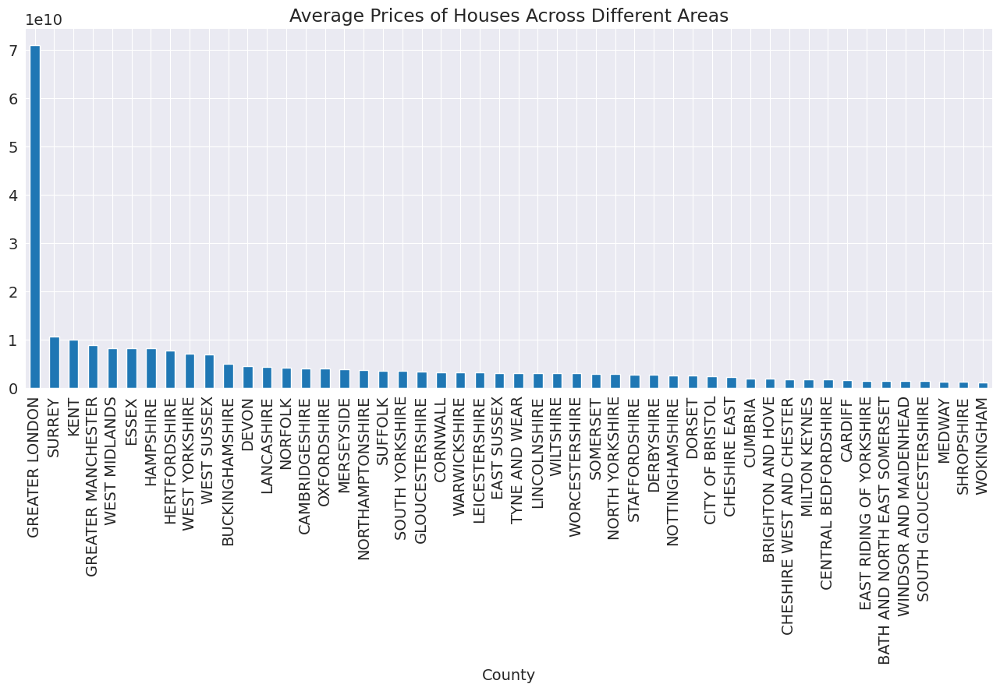

In [148]:
# checking the average prices of every area
new = raw_df.groupby(raw_df['County'])['Price'].sum().sort_values(ascending =False)[:50]
new.plot(kind='bar',grid=True, figsize=(16,6),title='Average Prices of Houses Across Different Areas');

The observation that the **average property prices in London are notably higher compared to other areas** might be because of London's fame and high population contribute to the premium property prices, the city's economic significance, limited space, global appeal, historical value, and investment opportunities collectively play pivotal roles in establishing its real estate as one of the most expensive and sought-after in the world

In [ ]:
# checking the house price range
fig=px.histogram(raw_df,
                 x='Price',
                 marginal='violin',
                 nbins=5,
                 title='Price of houses',

                )
fig.update_layout(bargap=0.2,
                  font_family='Courier New',
                  font_color='blue',
                  yaxis_title='Numper of house'
                  )
fig.show()

the observed data indicates that the maximum property prices are around 20 million, it suggests that within the dataset or specific market under consideration, the highest recorded or listed property prices do not exceed the 20 million mark.

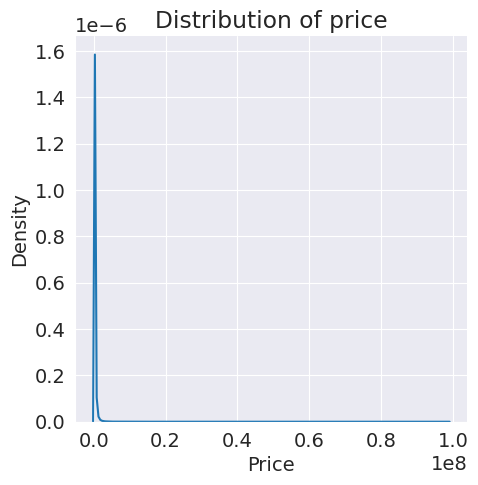

In [157]:
sns.displot(raw_df['Price'],kind='kde')
plt.title('Distribution of price')
plt.show()

Now we see that your data is noramally distributed

Now, let look at the month data

In [ ]:
raw_df['month'].unique()

array(['January', 'March', 'April', 'February', 'July', 'August', 'May',
       'June', 'September', 'October', 'November', 'December'],
      dtype=object)

It's look like that the sequence of month name is not in correct squence.

In [16]:
month=['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November','December']

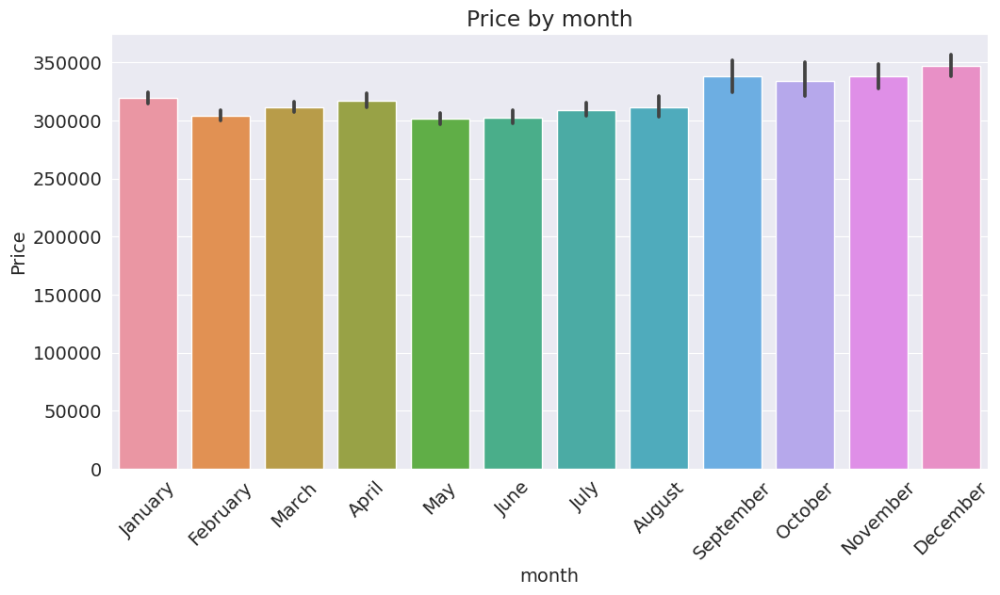

In [156]:
plt.xlabel("month name")
plt.ylabel("Price")
plt.title("Price by month")
plt.xticks(rotation =45)

sns.barplot(x=raw_df['month'], y=raw_df['Price'], order = month)
plt.show()

the graph or data illustrates an increase in property prices from September to December, it suggests a trend where property prices experienced a rise during this period.Several reasons might contribute to such an increase in property prices during these months such as Seasonal Trends, Market Dynamics.

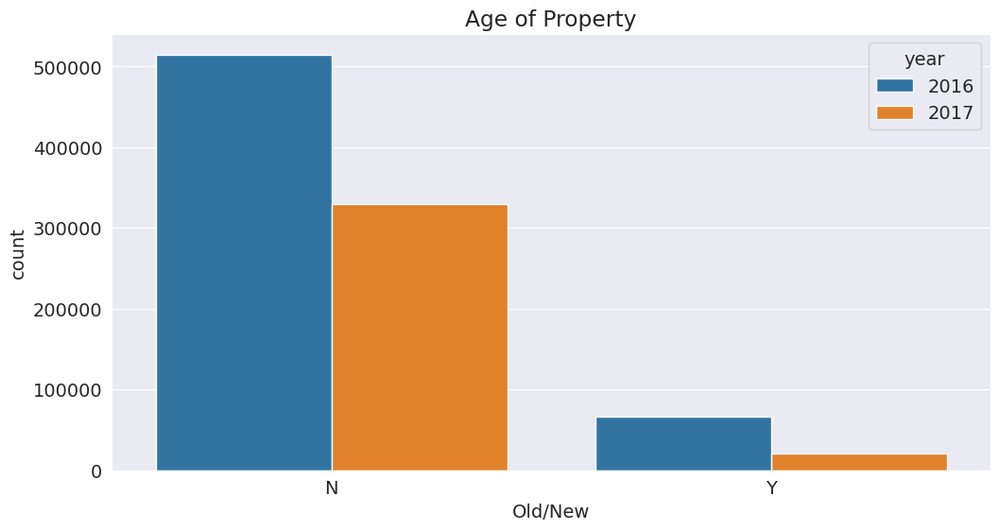

In [154]:
matplotlib.rcParams['figure.figsize'] = (12, 6)
plt.xlabel("condition")
plt.ylabel("No. of houses")
plt.title("Age of Property")

sns.countplot(x=raw_df['Old/New'], hue=raw_df['year'])
plt.show()

To explain the trend observed in the graph indicating a higher availability of new or established residential buildings in the region in 2016 compared to a significant reduction in 2017.

The decrease in available new or established residential buildings in 2017 compared to 2016 may be due to various factors:

Market Dynamics: It could indicate a shift in the real estate market, Economic Factors: Economic fluctuations, changes in interest rates, or other financial aspects might have impacted the construction or availability of residential buildings.For example, economic slowdowns can often lead to a reduction in new constructions.and Regulatory Changes,Saturation or Demand-Supply Balance,Completion of Projects and many other factor can be the reason of decrese in availablity

In [ ]:
# checking the unique value in year columns
raw_df['year'].unique()

array([2016, 2017])

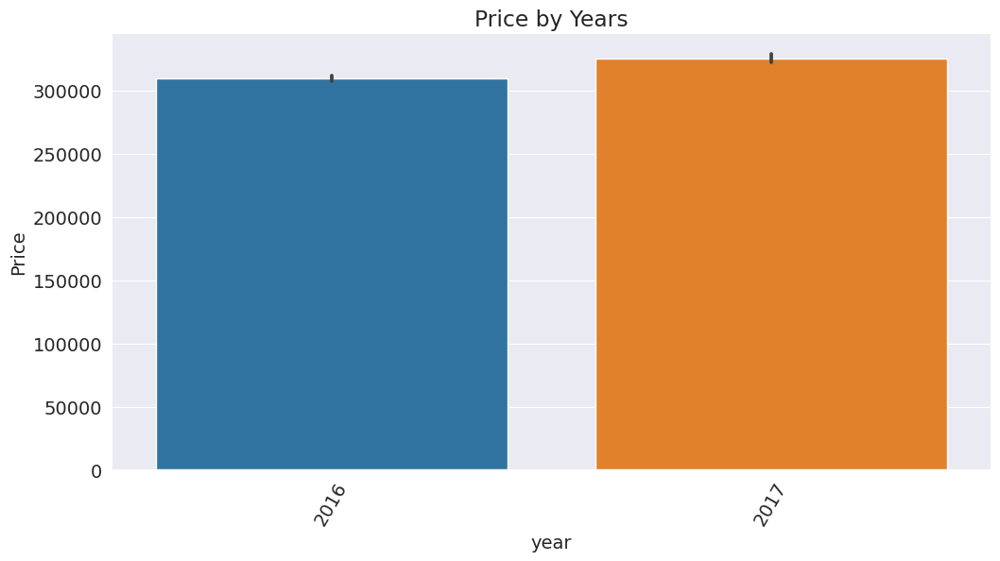

In [155]:
plt.xlabel("month name")
plt.ylabel("Price")
plt.xticks(rotation=60)
plt.title("Price by Years")

sns.barplot(x=raw_df['year'], y=raw_df['Price'])
plt.show()

The correlation between property availability and pricing is often observed in real estate markets. When there's a decrease in property availability or a reduction in the number of properties listed, it can lead to increased prices due to higher demand relative to the limited supply.

In [ ]:
#checking the property type according to their sell
prop_type = raw_df['Property Type'].value_counts()
prop_type

T    261450
S    236879
D    215293
F    170714
O     47104
Name: Property Type, dtype: int64

In above data we can see that the terraced property are sold high in numbers as compared to another property type.and reason could be these ,The area under consideration might witness more construction or investment in terraced properties, influencing their higher sales numbers.
In certain regions, terraced houses might be the predominant housing style due to historical or regional factors, affecting their market presence.

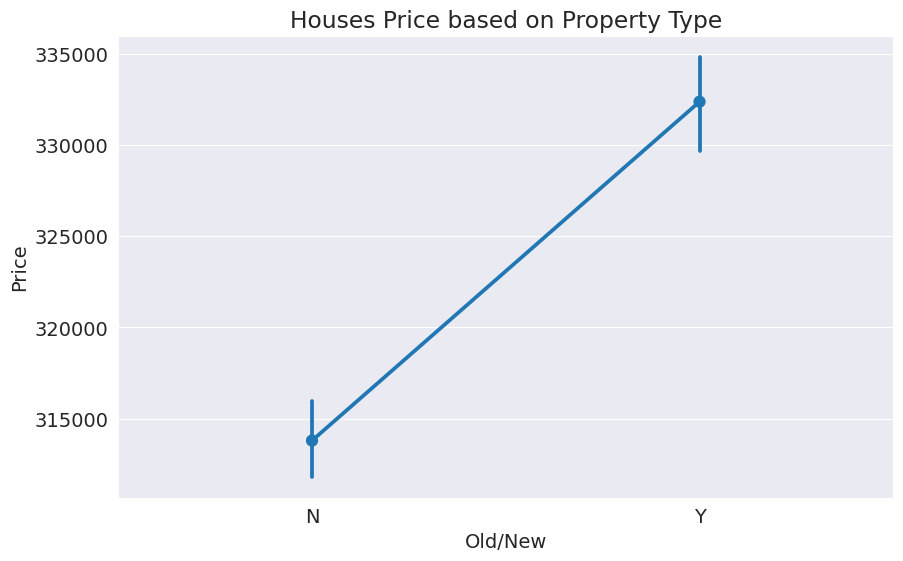

In [151]:
# checking the price of house base on property
sns.pointplot(data=raw_df, x='Old/New', y='Price')
plt.title('Houses Price based on Property Type')
plt.show()

Old/New Indicates the age of the property and applies to all price paid transactions, residential and non-residential.

Y = a newly built property,
N = an established residential building.


In above graph show that the Y:- a newly build property's prices are higher as compared to established building.The distinction between these property types showcases a price difference,highlighting that buyers might typically pay more for newly built houses in comparison to older, established properties.

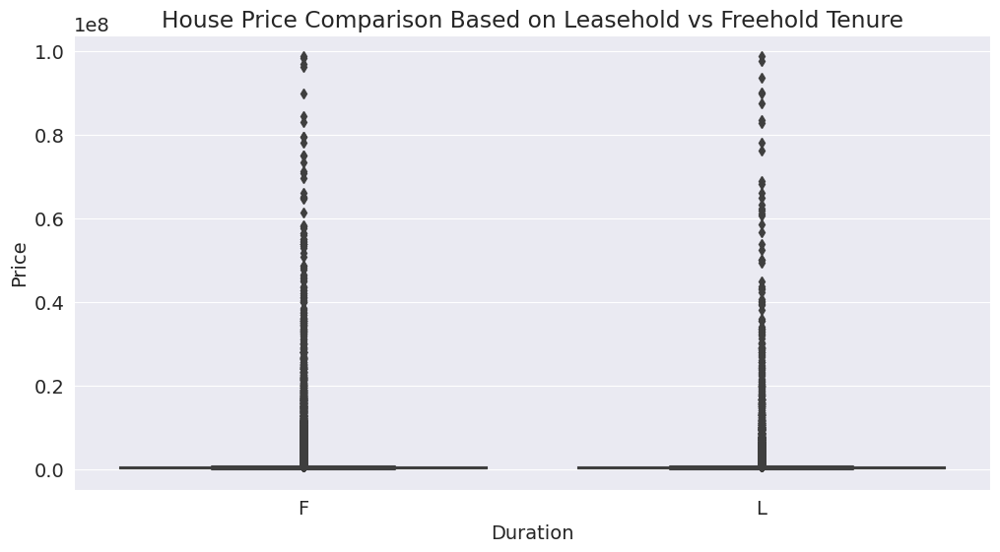

In [158]:
sns.boxplot(raw_df,x='Duration',y='Price')
plt.title('House Price Comparison Based on Leasehold vs Freehold Tenure')
plt.show()

Duration Relates to the tenure
F= Freehold,
L= Leasehold

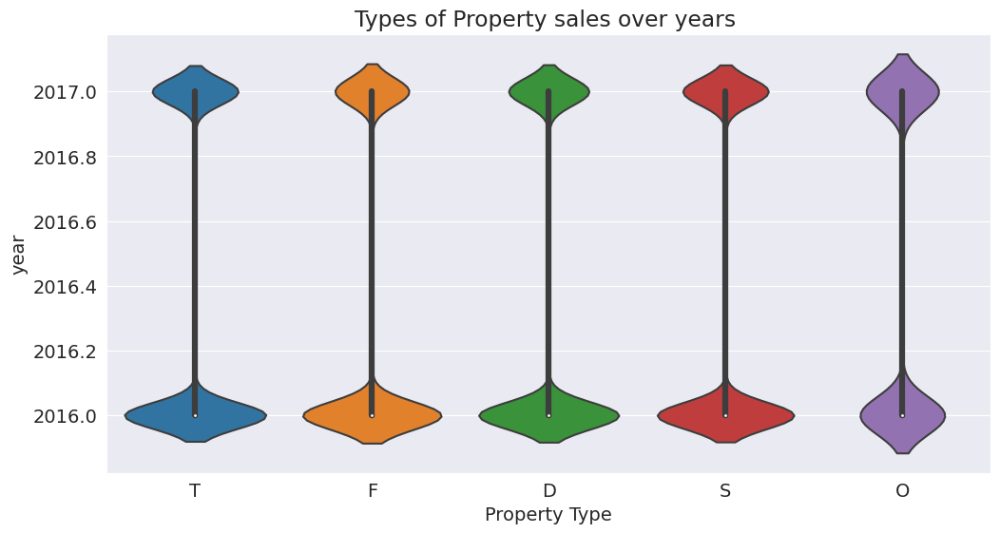

In [ ]:
sns.violinplot(data=raw_df, y='year', x='Property Type')
plt.title('Types of Property sales over years ');

Property Type

D = Detached

S = Semi-Detached

T = Terraced

F = Flats/Maisonettes

O = Other


the decrease in real estate sales in 2017 could indeed be influenced by a combination of higher property prices and a limited supply of available houses. These factors might have contributed to a market environment where buyers were more cautious, leading to a reduction in the number of real estate transactions during that period.

# Translating Business Problem to Machine Learning

**Target variable**: Predict “Price” for dates in the future using current information. Our target variable “Price”, is a series of continuous values.

**Input variables** : We can categorise the variables as below

**Inputs** : 'Property Type', 'Old/New', 'Duration','Town/City_encoded', 'District_encoded', 'County_encoded', 'PPDCategory Type'

**Model**:
This problem can be modeled using a single classical supervised machine learning regression .

We will use a regression model to predict our target variable Price which is a Continuous Variable based on time series.

We will explore the following categories of models, engineer features and hypertune parameters to choose a model with the best fit.

* Linear models

* Tree models

* Ensemble models

* Evaluation criteria. RMSE

### Target Mean Encoding for large Categories

In [18]:
def mean_encoding(df, col):
  price_df = df.groupby(col)[['Price']].mean()
  price_df = price_df.reset_index()
  price_df.columns = [col, col+'_encoded']
  df = df.merge(price_df, on=col)
  return df

In [19]:
raw_df = mean_encoding(raw_df, 'County')

In [20]:
raw_df.describe()

,Price,year,County_encoded
count,9.314400e+05,931440.000000,931440.000000
mean,3.155389e+05,2016.375441,315538.925200
std,9.347614e+05,0.484237,173595.803688
min,1.000000e+00,2016.000000,93472.445523
25%,1.350000e+05,2016.000000,197150.644597
50%,2.100000e+05,2016.000000,258720.004249
75%,3.330000e+05,2017.000000,360538.200114
max,9.890000e+07,2017.000000,762859.491852


## Split Training & Validation Set

We'll set aside 80% of the data as training data & 10% of the data as the validation set, to evaluate the models we train on previously unseen data & 10% of the data as test set.

## Extract Inputs & Outputs Features

### Spliting the Dataset

In [21]:
# install scikit learn
!pip install scikit-learn --upgrade --quiet

In [22]:
from sklearn.model_selection import train_test_split

In [23]:
# spilt dataset into 80-10-10 ratio
train_val_df, test_df = train_test_split(raw_df, test_size=0.2,random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [24]:
# checking the shape of split data
print('Train_df.shape:', train_df.shape)
print('val_df.shape:', val_df.shape)
print('Test_df.shape:', test_df.shape)

Train_df.shape: (558864, 10)
val_df.shape: (186288, 10)
Test_df.shape: (186288, 10)


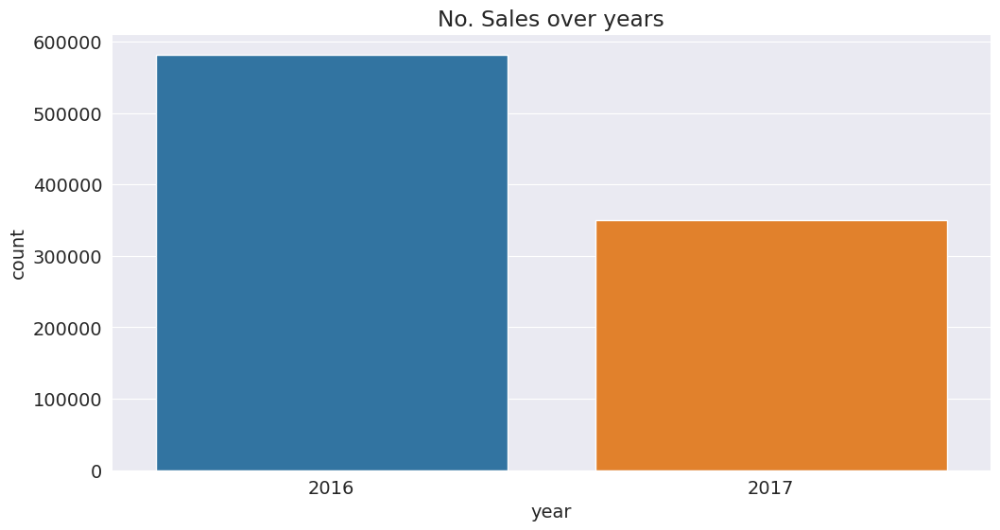

In [ ]:
plt.title('No. Sales over years')
sns.countplot(x=raw_df['year']);

the relationship between the availability of houses and the sales volume in the real estate market is interconnected. High availability generally boosts sales, while low availability can constrain sales due to limited options or increased competition. This relationship highlights the significance of housing supply in shaping the real estate market's sales performance.

In [25]:
# checking the training data
train_df[:5]

,Price,Date of Transfer,Property Type,Old/New,Duration,County,PPDCategory Type,year,month,County_encoded
513651,178000,2016-03-21,S,N,F,KENT,A,2016,March,329735.786519
524981,474995,2016-10-21,D,Y,F,KENT,A,2016,October,329735.786519
221790,184000,2017-03-03,S,N,F,SOMERSET,A,2017,March,259213.896931
914478,395000,2016-09-28,D,Y,F,SUFFOLK,A,2016,September,276824.005694
170007,110000,2016-10-07,S,N,F,CUMBRIA,A,2016,October,193235.724518


In [26]:
# checking the validation dataset
val_df[:5]

,Price,Date of Transfer,Property Type,Old/New,Duration,County,PPDCategory Type,year,month,County_encoded
692049,478000,2016-12-02,D,N,F,NORTHAMPTONSHIRE,A,2016,December,248907.392184
753163,162500,2017-01-12,O,N,F,DORSET,B,2017,January,321818.504962
663616,266000,2017-04-26,S,N,F,GLOUCESTERSHIRE,A,2017,April,307297.149151
885128,370000,2016-12-09,D,N,F,SURREY,A,2016,December,553460.829864
9139,192500,2016-11-25,T,Y,F,DEVON,A,2016,November,281603.604561


In [27]:
# checking the test dataset
test_df[:5]

,Price,Date of Transfer,Property Type,Old/New,Duration,County,PPDCategory Type,year,month,County_encoded
414179,147000,2016-05-27,S,N,F,LEICESTERSHIRE,A,2016,May,238270.332500
463280,93000,2017-04-28,T,N,L,SOUTH YORKSHIRE,B,2017,April,187034.645930
662765,100000,2016-07-05,T,N,F,GLOUCESTERSHIRE,A,2016,July,307297.149151
799054,93000,2016-05-04,T,N,F,COUNTY DURHAM,A,2016,May,137506.557804
646257,148000,2017-03-24,S,N,F,WEST MIDLANDS,A,2017,March,217719.400558


# Identifying Input and Target Columns

In [28]:
input_cols = ['Property Type', 'Old/New', 'Duration', 'County_encoded', 'PPDCategory Type']
target_cols = 'Price'

In [29]:
print(input_cols)

['Property Type', 'Old/New', 'Duration', 'County_encoded', 'PPDCategory Type']


In [30]:
target_cols

'Price'

### Training

In [31]:
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_cols].copy()

In [32]:
train_inputs

,Property Type,Old/New,Duration,County_encoded,PPDCategory Type
513651,S,N,F,329735.786519,A
524981,D,Y,F,329735.786519,A
221790,S,N,F,259213.896931,A
914478,D,Y,F,276824.005694,A
170007,S,N,F,193235.724518,A
...,...,...,...,...,...
306671,F,N,L,318423.975436,B
825980,S,N,F,195379.957769,A
823816,S,N,F,195379.957769,A
365492,T,N,F,175383.883180,A


In [33]:
train_targets

513651    178000
524981    474995
221790    184000
914478    395000
170007    110000
           ...  
306671    157000
825980    130000
823816    122000
365492     94500
105374    290000
Name: Price, Length: 558864, dtype: int64

### Validation

In [34]:
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_cols].copy()

In [35]:
val_inputs

,Property Type,Old/New,Duration,County_encoded,PPDCategory Type
692049,D,N,F,248907.392184,A
753163,O,N,F,321818.504962,B
663616,S,N,F,307297.149151,A
885128,D,N,F,553460.829864,A
9139,T,Y,F,281603.604561,A
...,...,...,...,...,...
26950,F,Y,L,175872.583403,A
340824,T,N,F,209037.544694,A
26623,S,N,F,175872.583403,B
694802,S,N,F,248907.392184,A


In [36]:
val_targets

692049    478000
753163    162500
663616    266000
885128    370000
9139      192500
           ...  
26950     123950
340824    222500
26623     140000
694802    163000
633982    155000
Name: Price, Length: 186288, dtype: int64

### Test

In [37]:
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_cols].copy()

In [38]:
train_inputs

,Property Type,Old/New,Duration,County_encoded,PPDCategory Type
513651,S,N,F,329735.786519,A
524981,D,Y,F,329735.786519,A
221790,S,N,F,259213.896931,A
914478,D,Y,F,276824.005694,A
170007,S,N,F,193235.724518,A
...,...,...,...,...,...
306671,F,N,L,318423.975436,B
825980,S,N,F,195379.957769,A
823816,S,N,F,195379.957769,A
365492,T,N,F,175383.883180,A


In [39]:
train_targets

513651    178000
524981    474995
221790    184000
914478    395000
170007    110000
           ...  
306671    157000
825980    130000
823816    122000
365492     94500
105374    290000
Name: Price, Length: 558864, dtype: int64

### Dataset sizes

In [40]:
print('Total Dataset Size : ', raw_df.shape[0])
print('Traning Dataset Size : ', train_df.shape[0])
print('Validation Dataset Size : ', val_df.shape[0])
print('Test Dataset Size : ', test_df.shape[0])

Total Dataset Size :  931440
Traning Dataset Size :  558864
Validation Dataset Size :  186288
Test Dataset Size :  186288


## Scaling & Encoding

Scaling Numerical & categorical Feature

In [41]:
numerical_cols = train_inputs.select_dtypes(include = np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes('object').columns.tolist()

In [42]:
train_inputs[numerical_cols].describe()

,County_encoded
count,558864.000000
mean,315565.668049
std,173576.296497
min,93472.445523
25%,197150.644597
50%,258720.004249
75%,360538.200114
max,762859.491852


In [43]:
train_df[categorical_cols].nunique()

Property Type       5
Old/New             2
Duration            2
PPDCategory Type    2
dtype: int64

In [44]:
train_inputs[categorical_cols].isna().sum()

Property Type       0
Old/New             0
Duration            0
PPDCategory Type    0
dtype: int64

In [45]:
train_inputs[numerical_cols].isna().sum()

County_encoded    0
dtype: int64

### Encoding the dataset

In [46]:
from sklearn.preprocessing import MinMaxScaler

In [47]:
scaler = MinMaxScaler()

In [48]:
scaler.fit(raw_df[numerical_cols])

MinMaxScaler()

In [49]:
print('minimum:')
list(scaler.data_min_)

minimum:


[93472.44552319309]

In [50]:
print('maximum:')
list(scaler.data_max_)

maximum:


[762859.4918515652]

In [51]:
train_inputs[numerical_cols]= scaler.transform(train_inputs[numerical_cols])
val_inputs[numerical_cols]= scaler.transform(val_inputs[numerical_cols])
test_inputs[numerical_cols]= scaler.transform(test_inputs[numerical_cols])

In [52]:
train_inputs[numerical_cols].describe()

,County_encoded
count,558864.000000
mean,0.331786
std,0.259306
min,0.000000
25%,0.154885
50%,0.246864
75%,0.398971
max,1.000000


In [53]:
raw_df[categorical_cols].nunique()

Property Type       5
Old/New             2
Duration            2
PPDCategory Type    2
dtype: int64

In [54]:
from sklearn.preprocessing import OneHotEncoder

In [55]:
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

In [56]:
encoder.fit(raw_df[categorical_cols])

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


OneHotEncoder(handle_unknown='ignore', sparse=False, sparse_output=False)

In [57]:
encoder.categories_

[array(['D', 'F', 'O', 'S', 'T'], dtype=object),
 array(['N', 'Y'], dtype=object),
 array(['F', 'L'], dtype=object),
 array(['A', 'B'], dtype=object)]

In [58]:
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
print(encoded_cols)

['Property Type_D', 'Property Type_F', 'Property Type_O', 'Property Type_S', 'Property Type_T', 'Old/New_N', 'Old/New_Y', 'Duration_F', 'Duration_L', 'PPDCategory Type_A', 'PPDCategory Type_B']


In [59]:
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])

In [60]:
train_inputs = train_inputs.drop(categorical_cols, axis=1)
val_inputs = val_inputs.drop(categorical_cols, axis=1)
test_inputs = test_inputs.drop(categorical_cols, axis=1)

In [61]:
pd.set_option('display.max_columns',None)

In [62]:
test_inputs

,County_encoded,Property Type_D,Property Type_F,Property Type_O,Property Type_S,Property Type_T,Old/New_N,Old/New_Y,Duration_F,Duration_L,PPDCategory Type_A,PPDCategory Type_B
414179,0.216314,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
463280,0.139773,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
662765,0.319434,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
799054,0.065783,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
646257,0.185613,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
129709,1.000000,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
634760,0.185613,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
152077,0.355037,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
867417,0.238643,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0


In [63]:
print('train_inputs:', train_inputs.shape)
print('train_targets:', train_targets.shape)
print('val_inputs:', val_inputs.shape)
print('val_targets:', val_targets.shape)
print('test_inputs:', test_inputs.shape)
print('test_targets:', test_targets.shape)

train_inputs: (558864, 12)
train_targets: (558864,)
val_inputs: (186288, 12)
val_targets: (186288,)
test_inputs: (186288, 12)
test_targets: (186288,)


In [64]:
val_inputs

,County_encoded,Property Type_D,Property Type_F,Property Type_O,Property Type_S,Property Type_T,Old/New_N,Old/New_Y,Duration_F,Duration_L,PPDCategory Type_A,PPDCategory Type_B
692049,0.232205,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
753163,0.341127,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
663616,0.319434,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
885128,0.687178,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
9139,0.281050,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
26950,0.123098,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
340824,0.172643,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
26623,0.123098,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
694802,0.232205,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0


Train Hardcoded & BaseLine Models

* Hardcoded Model : always predict fare
* Baseline Model : Linear Regression

### Train & Evaluate Hardcoded Model

Let's crate a simple model that always predicts the average

In [65]:
from sklearn.metrics import mean_squared_error

In [231]:
def rmse(targets, preds):
  return mean_squared_error(targets, preds,squared=False)

In [67]:
class MeanRegressor:
  def fit(self, inputs, targets):
    self.mean = targets.mean()

  def predict(self, inputs):
    return np.full(inputs.shape[0], self.mean)


In [70]:
mean_model = MeanRegressor()

In [71]:
mean_model.fit(train_inputs, train_targets)

In [72]:
mean_model.mean

315759.08298083255

In [73]:
train_preds = mean_model.predict(train_inputs)
train_preds

array([315759.08298083, 315759.08298083, 315759.08298083, ...,
       315759.08298083, 315759.08298083, 315759.08298083])

In [74]:
val_preds = mean_model.predict(val_inputs)
val_preds

array([315759.08298083, 315759.08298083, 315759.08298083, ...,
       315759.08298083, 315759.08298083, 315759.08298083])

In [164]:
train_rmse = rmse(train_targets, train_preds)
train_rmse

943739.8456945121

In [165]:
val_rmse = rmse(val_targets, val_preds)
val_rmse

908785.3084939831

Now let's check the correlation matrix for the features in dataset

In [166]:
train_corr = train_inputs.corr()

<Axes: >

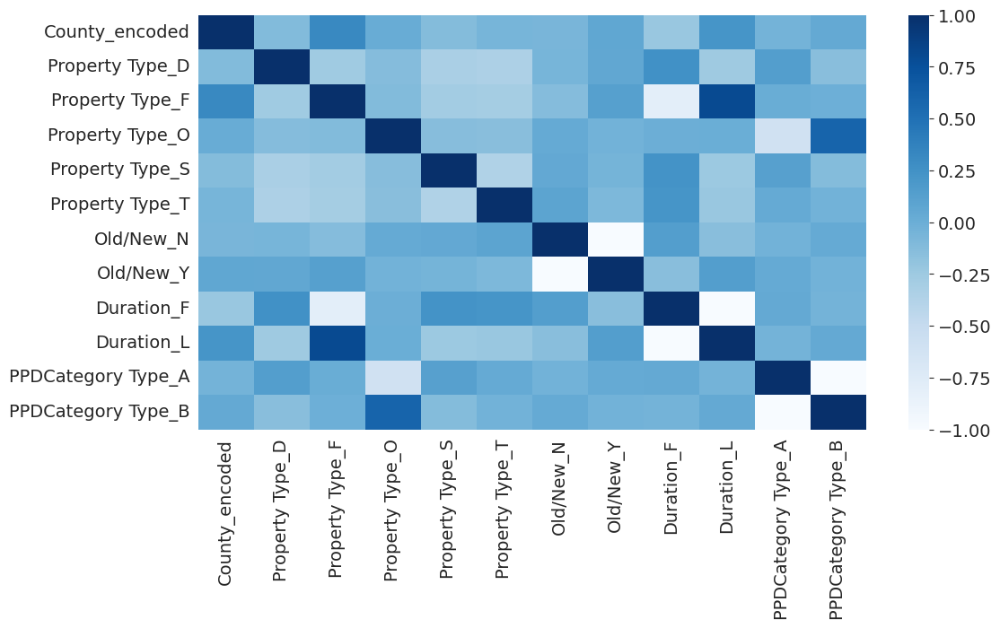

In [167]:
sns.heatmap(train_corr, cmap='Blues')

# Train & Evaluate Baseline Model

In [168]:
def evaluate(model):
    train_preds = model.predict(train_inputs)
    train_rmse = mean_squared_error(train_targets, train_preds, squared=False)
    val_preds = model.predict(val_inputs)
    val_rmse = mean_squared_error(val_targets, val_preds, squared=False)
    return train_rmse, val_rmse, train_preds, val_preds

## Linear Model

In [169]:
from sklearn.linear_model import LinearRegression

In [170]:
model_lr = LinearRegression()

In [171]:
model_lr.fit(train_inputs, train_targets)

LinearRegression()

In [172]:
evaluate(model_lr)

(911043.4212518004,
 873687.6113277009,
 array([296960., 449536., 220160., ..., 150528.,  95232., 736256.]),
 array([355328., 986112., 272384., ..., 110592., 208896.,  54272.]))

## Complex Model Training & Evaluation

We'll train a linear regression model as our baseline, which tries to express the target as a weighted sum of the inputs.

Hyperparameter Tuning



In [173]:
import matplotlib.pyplot as plt


def test_params(modelclass, **params):
  model = modelclass(**params).fit(train_inputs, train_targets)
  train_rmse = mean_squared_error(model.predict(train_inputs),train_targets, squared=False)
  val_rmse = mean_squared_error(model.predict(val_inputs),val_targets, squared=False)
  return train_rmse, val_rmse


def test_param_and_plot(ModelClass, param_name, param_values, **other_params):
    train_errors, val_errors = [], []
    for value in param_values:
        params = dict(other_params)
        params[param_name] = value
        train_rmse, val_rmse = test_params(ModelClass, **params)
        train_errors.append(train_rmse)
        val_errors.append(val_rmse)

    plt.figure(figsize=(10,6))
    plt.title('Overfitting curve: ' + param_name)
    plt.plot(param_values, train_errors, 'b-o')
    plt.plot(param_values, val_errors, 'r-o')
    plt.xlabel(param_name)
    plt.ylabel('RMSE')
    plt.legend(['Training', 'Validation'])

# Decision Tree Model

In [174]:
from sklearn.tree import plot_tree, export_text

In [175]:
from sklearn.tree import DecisionTreeRegressor

In [176]:
model_dt = DecisionTreeRegressor(random_state=42)

In [177]:
model_dt.fit(train_inputs, train_targets)

DecisionTreeRegressor(random_state=42)

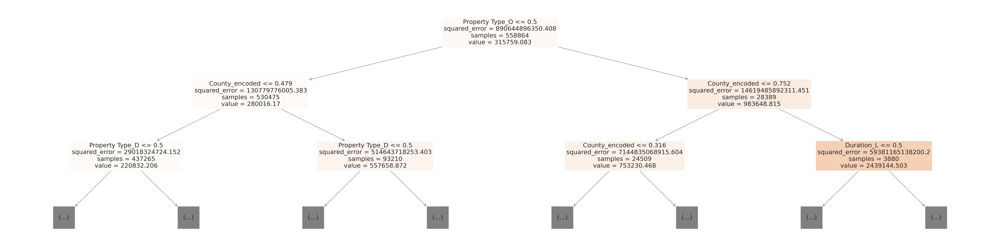

In [178]:
plt.figure(figsize=(80,20))
plot_tree(model_dt, feature_names=train_inputs.columns, max_depth=2, filled=True);

In [179]:
train_pred = model_dt.predict(train_inputs)

In [180]:
train_rmse = rmse(train_targets, train_pred)
train_rmse

899141.1034256829

In [181]:
val_pred = model_dt.predict(val_inputs)

val_rmse = rmse(val_targets, val_pred)
val_rmse

866261.380274983

Let's check the feature importance in dataset

In [182]:
model_dt.feature_importances_

array([5.61277298e-01, 6.84888253e-02, 6.52837620e-03, 2.90452297e-01,
       2.32245609e-03, 2.94361548e-04, 9.27303584e-03, 8.27552760e-03,
       5.39023902e-03, 4.60116635e-02, 7.80371358e-04, 9.05549016e-04])

In [183]:
importance_df = pd.DataFrame({
    'feature' : train_inputs.columns,
    'importance': model_dt.feature_importances_
}).sort_values('importance',ascending=False)

In [184]:
importance_df.head(10)

,feature,importance
0,County_encoded,0.561277
3,Property Type_O,0.290452
1,Property Type_D,0.068489
9,Duration_L,0.046012
6,Old/New_N,0.009273
7,Old/New_Y,0.008276
2,Property Type_F,0.006528
8,Duration_F,0.005390
4,Property Type_S,0.002322
11,PPDCategory Type_B,0.000906


<Axes: title={'center': 'Feature Importance'}, xlabel='importance', ylabel='feature'>

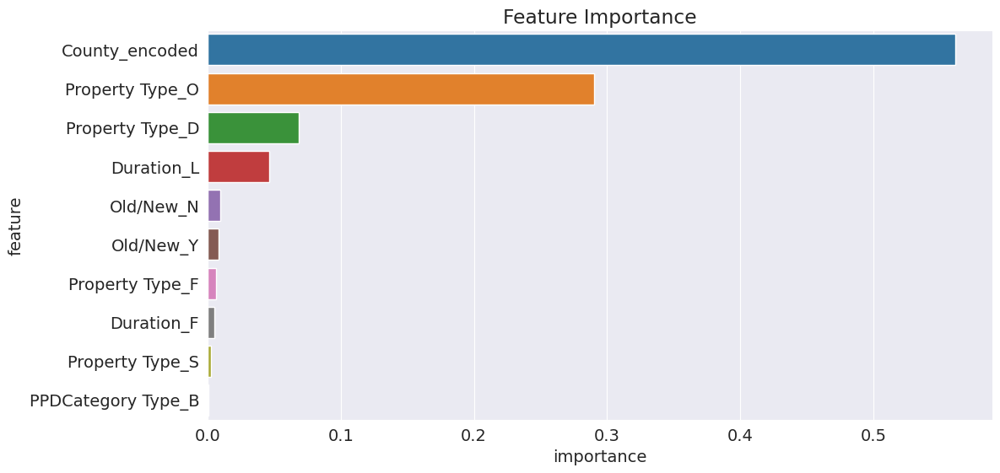

In [185]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10),
            x='importance',y='feature')

In [186]:
def max_depth_error(md):
  model = DecisionTreeRegressor(max_depth=md, random_state=42)
  model.fit(train_inputs, train_targets)
  train_acc = 1 - model.score(train_inputs, train_targets)
  val_acc = 1- model.score(val_inputs, val_targets)
  return{'Max depth': md, 'Training Error': train_acc, 'Validation Error': val_acc}

In [187]:
%%time
error_df = pd.DataFrame([max_depth_error(md) for md in range(1,16)])

CPU times: user 12.9 s, sys: 23.2 ms, total: 12.9 s
Wall time: 14.4 s


In [188]:
error_df

,Max depth,Training Error,Validation Error
0,1,0.973197,0.969243
1,2,0.936556,0.927927
2,3,0.925334,0.917710
3,4,0.918303,0.911804
4,5,0.916006,0.909153
5,6,0.914958,0.907998
6,7,0.913617,0.907579
7,8,0.912363,0.907543
8,9,0.911592,0.907260
9,10,0.910309,0.908075


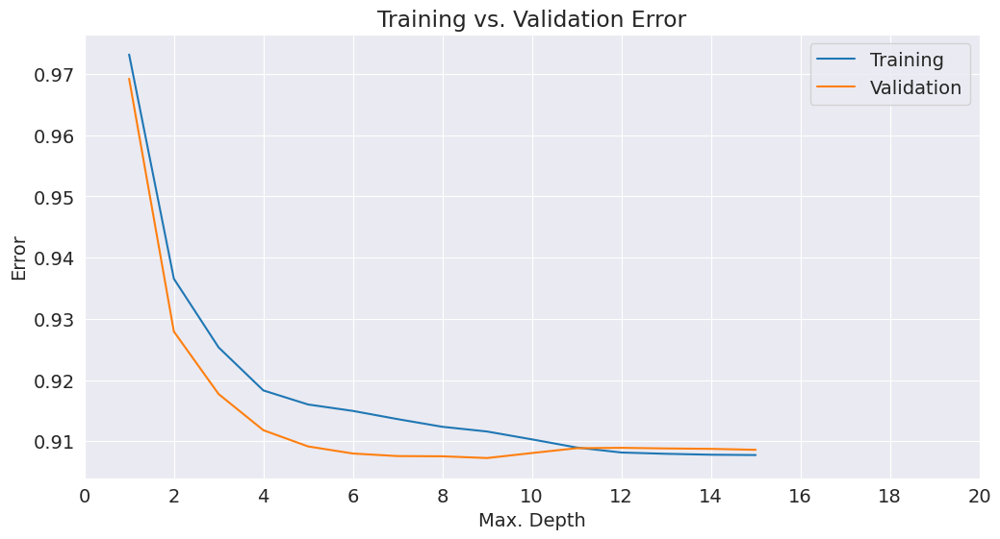

In [189]:
plt.figure()
plt.plot(error_df['Max depth'], error_df['Training Error'])
plt.plot(error_df['Max depth'], error_df['Validation Error'])
plt.title('Training vs. Validation Error')
plt.xticks(range(0,21, 2))
plt.xlabel('Max. Depth')
plt.ylabel('Error')
plt.legend(['Training', 'Validation'])

You'll often need to tune hyperparameters carefully to find the optimal fit. In the above case, it appears that a maximum depth of 11 results in the lowest validation error.

### `max_leaf_nodes`

Another way to control the size of complexity of a decision tree is to limit the number of leaf nodes. This allows branches of the tree to have varying depths.

In [190]:
model_dt1 = DecisionTreeRegressor(max_leaf_nodes=128,max_depth=11, random_state=42)

In [191]:
model_dt1.fit(train_inputs, train_targets)

DecisionTreeRegressor(max_depth=11, max_leaf_nodes=128, random_state=42)

In [192]:
train_pred = model_dt1.predict(train_inputs)

In [193]:
train_rmse = rmse(train_targets, train_pred)
train_rmse

900146.4305890693

In [194]:
val_pred = model_dt1.predict(val_inputs)

In [195]:
val_rmse = rmse(val_targets, val_pred)
val_rmse

866989.6094089972

In [197]:
def max_leaf_nodes(md):
  model = DecisionTreeRegressor(max_leaf_nodes=md, random_state=42)
  model.fit(train_inputs, train_targets)
  train_acc = 1 - model.score(train_inputs, train_targets)
  val_acc = 1- model.score(val_inputs, val_targets)
  return{'Max lead nodes': md, 'Training Error': train_acc, 'Validation Error': val_acc}

In [198]:
%%time
leaf_df = pd.DataFrame([max_leaf_nodes(md) for md in range(2,60)])

CPU times: user 48.1 s, sys: 63.9 ms, total: 48.2 s
Wall time: 52.1 s


In [199]:
leaf_df

,Max lead nodes,Training Error,Validation Error
0,2,0.973197,0.969243
1,3,0.954069,0.946831
2,4,0.936556,0.927927
3,5,0.932090,0.923261
4,6,0.928868,0.921920
5,7,0.927014,0.920130
6,8,0.924444,0.917270
7,9,0.922764,0.914850
8,10,0.921534,0.913491
9,11,0.920355,0.912218


You'll often need to tune hyperparameters carefully to find the optimal fit. In the above case, it appears that a maximum leaf node of 42 results in the lowest validation error.

In [200]:
model_dt2 = DecisionTreeRegressor(max_leaf_nodes=42,max_depth=11,random_state=42)
model_dt2.fit(train_inputs, train_targets)

DecisionTreeRegressor(max_depth=11, max_leaf_nodes=42, random_state=42)

In [201]:
train_pred = model_dt2.predict(train_inputs)

In [202]:
train_rmse = rmse(train_targets, train_pred)
train_rmse

902214.3463529715

In [203]:
val_pred = model_dt2.predict(val_inputs)

In [204]:
val_rmse = rmse(val_targets, val_pred)
val_rmse

866152.2607545647

# Random Forest Model

In [205]:
from sklearn.ensemble import RandomForestRegressor

In [206]:
rf_model = RandomForestRegressor(random_state=42, n_jobs=-1, n_estimators=10, max_depth = 5)

In [207]:
%%time
rf_model.fit(train_inputs, train_targets)

CPU times: user 7.27 s, sys: 34.3 ms, total: 7.31 s
Wall time: 6.13 s


RandomForestRegressor(max_depth=5, n_estimators=10, n_jobs=-1, random_state=42)

In [208]:
train_pred = rf_model.predict(train_inputs)


In [209]:
train_rmse = rmse(train_targets, train_pred)
train_rmse

902922.1657185687

In [210]:
val_pred = rf_model.predict(val_inputs)

In [211]:
val_rmse = rmse(val_targets, val_pred)
val_rmse

866111.1418973507

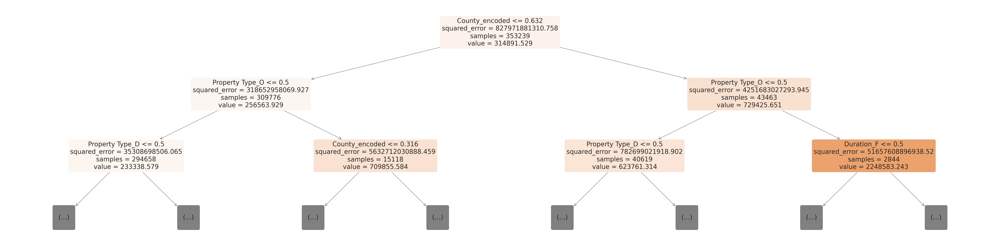

In [212]:
plt.figure(figsize=(80,20))
plot_tree(rf_model.estimators_[0], max_depth=2, feature_names=train_inputs.columns, filled=True, rounded=True);

In [213]:
len(rf_model.estimators_)

10

Let's check the feature importance in dataset

In [214]:
importance_df = pd.DataFrame({
    'feature': train_inputs.columns,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

In [215]:
importance_df.head(10)

,feature,importance
0,County_encoded,0.492900
3,Property Type_O,0.360222
1,Property Type_D,0.078005
8,Duration_F,0.035277
9,Duration_L,0.014886
7,Old/New_Y,0.007253
2,Property Type_F,0.006813
6,Old/New_N,0.004057
10,PPDCategory Type_A,0.000545
11,PPDCategory Type_B,0.000042


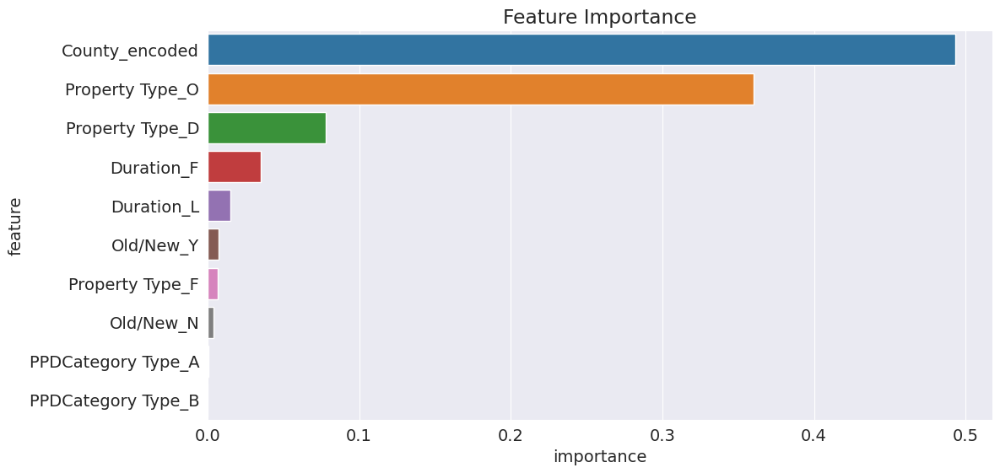

In [216]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

# Selected Model

In [217]:
selected_model = model_dt2
selected_model

DecisionTreeRegressor(max_depth=11, max_leaf_nodes=42, random_state=42)

In [218]:
train_pred = model_dt2.predict(train_inputs)
train_rmse = rmse(train_targets, train_pred)
train_rmse

902214.3463529715

In [219]:
val_pred = model_dt2.predict(val_inputs)
val_rmse = rmse(val_targets, val_pred)
val_rmse

866152.2607545647

In [220]:
importance_df = pd.DataFrame({
    'feature': train_inputs.columns,
    'importance': model_dt2.feature_importances_
}).sort_values('importance', ascending=False)

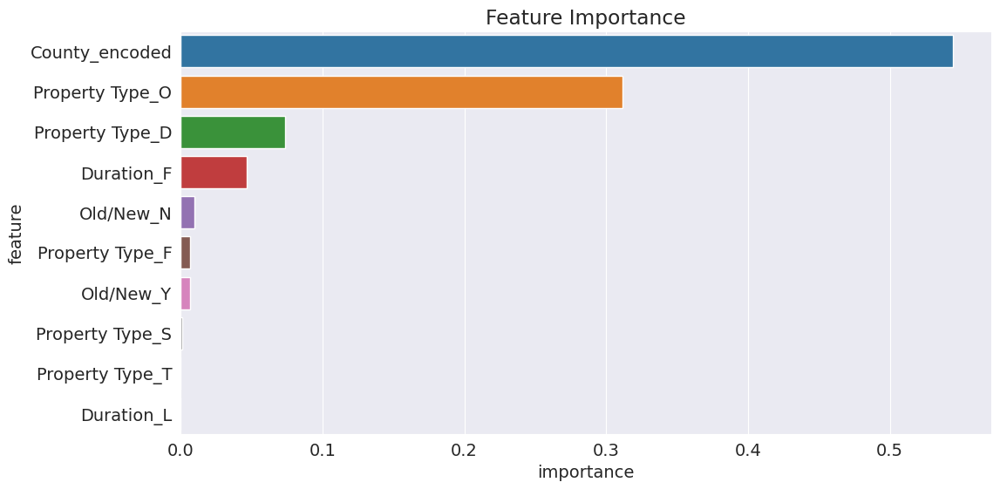

In [221]:
importance_df.head(10)

plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

# Prediction on Test dataset

In [222]:
# joning the train and val inputs dataset
new_train_inputs = train_inputs.copy()
new_train_inputs = new_train_inputs.append(val_inputs, ignore_index=True)
new_train_inputs

<ipython-input-222-404db5f98b21>:3: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,County_encoded,Property Type_D,Property Type_F,Property Type_O,Property Type_S,Property Type_T,Old/New_N,Old/New_Y,Duration_F,Duration_L,PPDCategory Type_A,PPDCategory Type_B
0,0.352955,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
1,0.352955,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
2,0.247602,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,0.273910,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0
4,0.149037,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
745147,0.123098,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
745148,0.172643,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
745149,0.123098,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
745150,0.232205,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0


In [223]:
# joining the training target and val target dataset
new_train_targets= train_targets.append(val_targets)

<ipython-input-223-8aaf4c249030>:2: FutureWarning:

The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



Let's check on Best model

In [237]:
#fit into decision tree algoritum
model_dt_new = DecisionTreeRegressor(max_leaf_nodes=42,max_depth=11,random_state=42)
model_dt_new.fit(new_train_inputs,new_train_targets)

DecisionTreeRegressor(max_depth=11, max_leaf_nodes=42, random_state=42)

In [238]:
#checking test prediction
new_train_pred = model_dt_new.predict(new_train_inputs)

In [239]:
new_train_rmse = rmse(new_train_targets,new_train_pred)
new_train_rmse

893212.3070349578

In [240]:
test_pred = model_dt_new.predict(test_inputs)

In [241]:
new_test_rmse = rmse(test_targets, test_pred)
new_test_rmse

893598.7087159369

# Save the Best Model

In [229]:
import joblib
uk_house_price_predictor_random_forest = {
    'model': selected_model,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_col': target_cols,
    'numeric_cols': numerical_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [230]:
joblib.dump(uk_house_price_predictor_random_forest, 'uk_house_price_predictor_decision_tree.joblib')

['uk_house_price_predictor_decision_tree.joblib']

In this notebook we explored Supervised Machine Learning methods. Regression models such as linear regression, decision tree and ensemble models such as RandomForest were trained to predict uk house prices using Scikit Learn. We used Pandas, Numpy, Matplotlib, Seaborn and Plotly to perform the exploratory data analysis and gather insights for machine learning.

* Our dataset had 1000000 rows ( train = 5,58,864, val = 1,86,288, test = 1,86,288,) and 12 columns.

* We prepared the data by merging features with the train and test data sets, split the train data into train and val sets (90:10), eliminated duplicate records , encoded categorical values ( Type - Target Mean Encoding,Country) & ( Type - OneHot Encoding, Date of Transfer,
Property Type,
Old/New,
Duration,
Town/City,
District,
County,
PPDCategory Type : 0 - 1) and scaled the values using MinMaxScaler.
* Our model training utilized a dataset that displayed significant skewness, characterized by a substantial imbalance and irregular distribution of values, encompassing both prominent outliers and notably small data points. In an effort to address this issue.
* Decision trees performed better than linear model as they are non-linear models. While we can tune the hyperparameters to reduce overfitting we can also use more powerful ensemble models.

* Decision Tress performed the best with simple inputs and some hyperparameter tuning (max_leaf_nodes=42, max_depth =11 ) or feature engineering.

* Feature Engineering: We experimented with various features based on EDA for Price, Date of Transfer, Property Type, Old/New, Duration, Town/City, District, County, PPDCategory Type etc and selected the following features for the next step.
Date of Transfer,
Property Type,
Old/New,
Duration,
Town/City,
District,
County,
PPDCategory Type
* Decision Tree had the best performance after hyperparameter tuning
Hyperparameters: max_leaf_nodes=42, 'max_depth': 11
* Best Predictors of House Pricing were:-
![](https://i.imgur.com/nxZFjUh.png)



# Learning & Limitaions

* Start with simplest 4-5 features and select a model without hyperparameter tuning.

* My first approach was heavily feature engineered, the Random forest model worked very well on the train and val data but performed very poorly on the test set.
* Train, Val and Test split should be carefully considered to mirror the test set or real world scenario.

* The best split was 80:10:10
* Feature Selection and Encoding of
 Nominal columns
* Property Type and District seem to have significant predictive power, but these are nominal categorial variables. Their values are (D = Detached, S = Semi-Detached, T = Terraced, F = Flats/Maisonettes, O = Others) and 449 Locations which are very important in terms of Price of House anywhere in the world. It is also likely that the models are assigning importance based on these values. These features improved model performance.

**Comparing and Contrasting Ensemble models Random Forest and Linear Regressor and Decision Tree  compare and contrast?**

![](https://i.imgur.com/toH3aUj.png)



RandomForest had the best performance but as we can see from the stats above, RandomForest and Decision Tree Regressor model can be nearly as good with the right hyperparameter tuning.

# Suggestions for Future Work

* Feature selection techniques such as PCA, Autoencoders etc
* Tune Lasso, Ridge, SGD models,XGBoost
* Optimal Hyperparameter tuning for example with RandomSearchCV
* Neural Network models such as LSTM
* Features from the target variable such as lag,aggregrate, rolling stats since we have time-series data
* Remove outliers and perform  interventions post prediction
* Stacking models
* Cleaner and more robust pipeline for transformation
* Compare and contrast ARIMA, Prophet, Classical Machine Learning and Neural Network models

## Tutorials

* Linear Regression with Scikit-Learn:- [Machine Learing by jovian](https://jovian.com/learn/zero-to-data-analyst-bootcamp)
* How to approach Machine Learning Problems:- [Machine Learing by jovian](https://jovian.com/learn/zero-to-data-analyst-bootcamp)
* Gradient Boosting Machines with XGBoost:- [Machine Learing by jovian](https://jovian.com/learn/zero-to-data-analyst-bootcamp)